## **Evaluation of Image Retrieval Using DINO Embeddings**

In this notebook, we will:
- Load the embeddings generated using the PLIP model.
- Use FAISS for similarity search to perform image retrieval.
- Evaluate the retrieval performance using appropriate metrics.
- Visualize the retrieval results.

---

## **Table of Contents**
---

1. Import Libraries
2. Load Embeddings and Image Files
3. Set Up Similarity Search (FAISS)
4. Perform Image Retrieval
5. Visualize Retrieval Results
6. Cluster Embeddings
7. Compute Unsupervised Evaluation Metrics
8. Conclusion

---
### **Step 1: Import Libraries**

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import faiss
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

---
### **Step 2: Load Embeddings and Image Files**

In [3]:
# Load embeddings and image files
embeddings = np.load('embeddings_dino.npy')
image_files = np.load('image_files_dino.npy')

print(f'Embeddings shape: {embeddings.shape}')
print(f'Number of images: {len(image_files)}')

Embeddings shape: (3360, 768)
Number of images: 3360


---
### **Step 3: Set Up Similarity Search with FAISS**

FAISS (Facebook AI Similarity Search) is a library for efficient similarity search and clustering of dense vectors.

In [4]:
# Define the dimension of the embeddings
d = embeddings.shape[1]

# Build the index
index = faiss.IndexFlatL2(d)

# Add embeddings to the index
index.add(embeddings)

print(f'Number of vectors in the index: {index.ntotal}')

Number of vectors in the index: 3360


---
### **Step 4: Perform Image Retrieval**

We will perform a k-nearest neighbors search for each image in the dataset.

In [5]:
# Define the number of nearest neighbors to retrieve
k = 6  # Retrieve 5 neighbors plus the query image itself

# Perform the search
distances, indices = index.search(embeddings, k)

print(f'Distances shape: {distances.shape}')
print(f'Indices shape: {indices.shape}')

Distances shape: (3360, 6)
Indices shape: (3360, 6)


---
### **Step 5: Visualize Retrieval Results**

Function to Display Images

In [6]:
def display_images(image_paths, titles=None, cols=6, figsize=(15, 8)):
    rows = len(image_paths) // cols + int(len(image_paths) % cols != 0)
    plt.figure(figsize=figsize)
    for idx, img_path in enumerate(image_paths):
        plt.subplot(rows, cols, idx+1)
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis('off')
        if titles is not None:
            plt.title(titles[idx], fontsize=8)
    plt.tight_layout()
    plt.show()

Visualize Retrieval for Sample Queries.

We can randomly select a few query images and visualize their retrieval results.

Query Image:


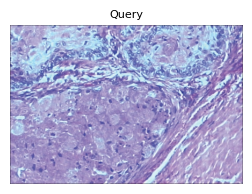

Retrieved Images:


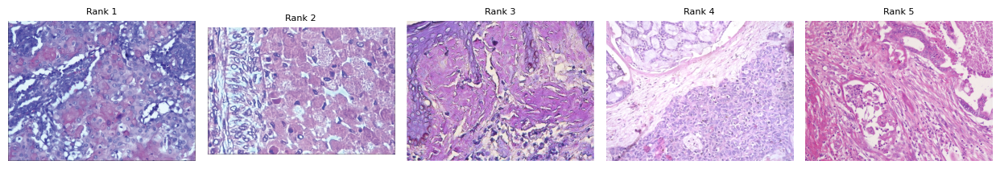

Query Image:


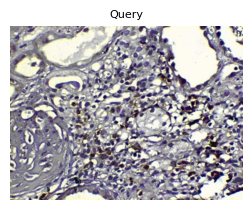

Retrieved Images:


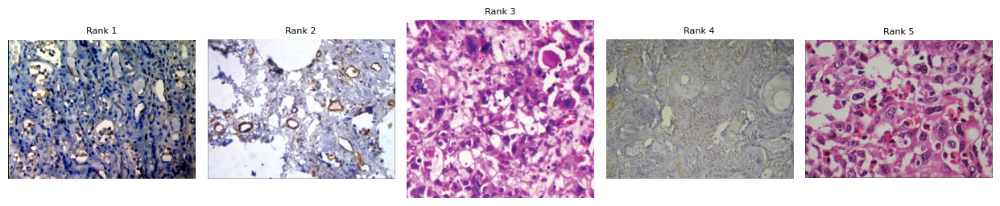

Query Image:


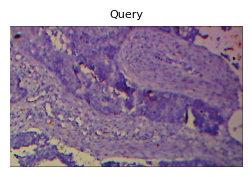

Retrieved Images:


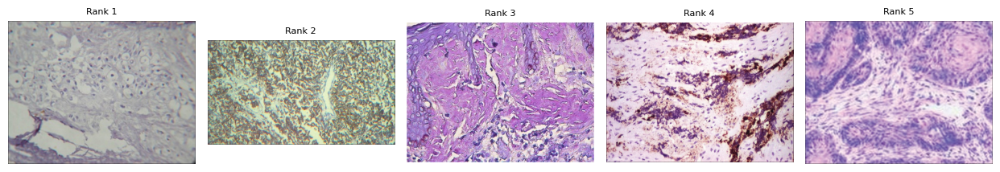

Query Image:


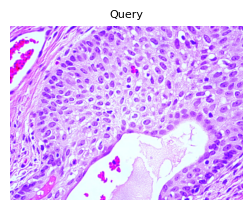

Retrieved Images:


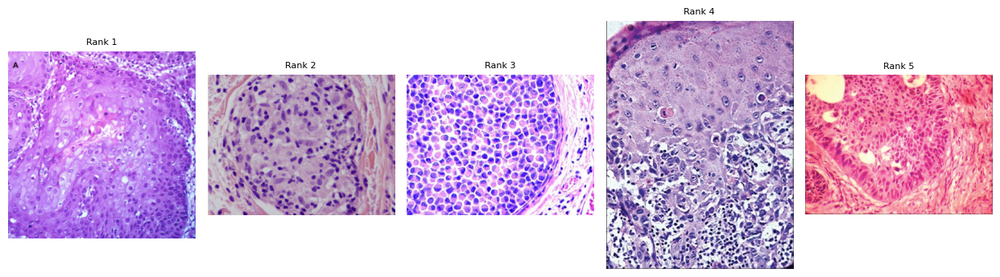

Query Image:


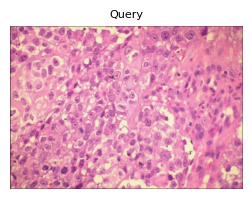

Retrieved Images:


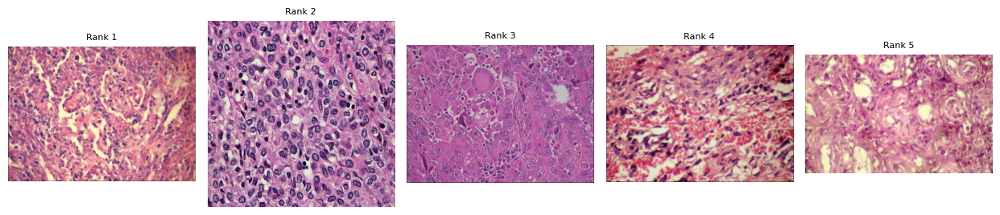

In [7]:
# Directory containing original images
original_images_dir = './combined_dataset/'  # Update this path accordingly

# Number of queries to visualize
num_queries = 5  # Adjust as needed

# Randomly select query indices
np.random.seed(42)  # For reproducibility
query_indices = np.random.choice(len(embeddings), size=num_queries, replace=False)

for idx in query_indices:
    # Get the query image
    query_image_file = image_files[idx]
    query_image_path = os.path.join(original_images_dir, query_image_file)
    
    # Get the retrieved images
    retrieved_indices = indices[idx][1:]  # Exclude the query image itself
    retrieved_image_files = image_files[retrieved_indices]
    retrieved_image_paths = [os.path.join(original_images_dir, img_file) for img_file in retrieved_image_files]
    
    # Display the query image
    print("Query Image:")
    display_images([query_image_path], titles=['Query'])
    
    # Display the retrieved images
    print("Retrieved Images:")
    titles = [f"Rank {i+1}" for i in range(len(retrieved_image_paths))]
    display_images(retrieved_image_paths, titles=titles)

---
### **Step 6: Cluster Embeddings**

We can use clustering algorithms like K-Means to group similar images and evaluate the cohesiveness of these clusters.

In [8]:
# Choose the number of clusters
num_clusters = 10  # Adjust as needed based on your dataset

# Initialize K-Means
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# Fit K-Means on the embeddings
cluster_labels = kmeans.fit_predict(embeddings)

# Add cluster labels to the DataFrame
df = pd.DataFrame({
    'image_file': image_files,
    'cluster_label': cluster_labels
})

---
### **Step 7: Compute Unsupervised Evaluation Metrics**

**Silhouette Score**

The Silhouette Score measures how similar an object is to its own cluster compared to other clusters. It ranges from -1 to 1, with higher values indicating better clustering.

In [9]:
# Compute Silhouette Score
sil_score = silhouette_score(embeddings, cluster_labels)
print(f'Silhouette Score: {sil_score:.4f}')

Silhouette Score: 0.0121


Visualize Sample Images from Each Cluster:

Cluster 0 (Total Images: 342):


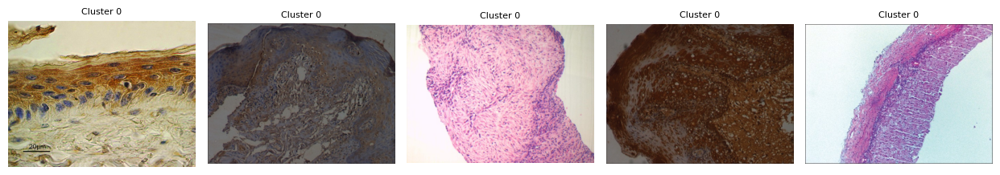

Cluster 1 (Total Images: 321):


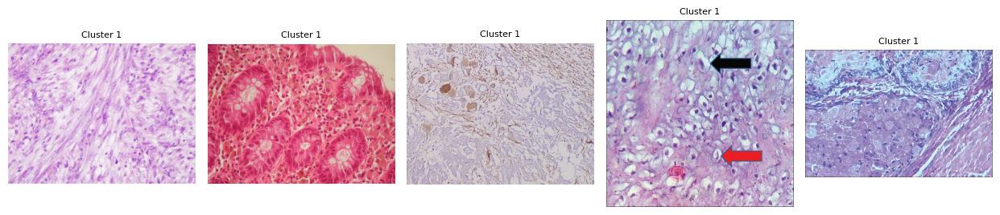

Cluster 2 (Total Images: 336):


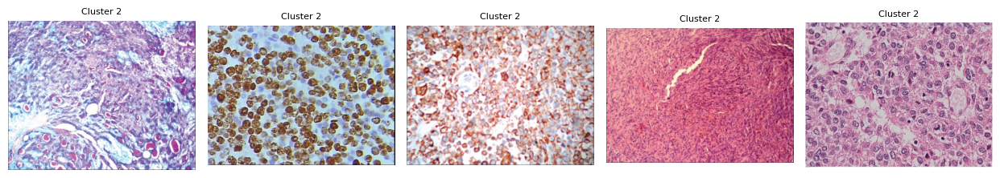

Cluster 3 (Total Images: 388):


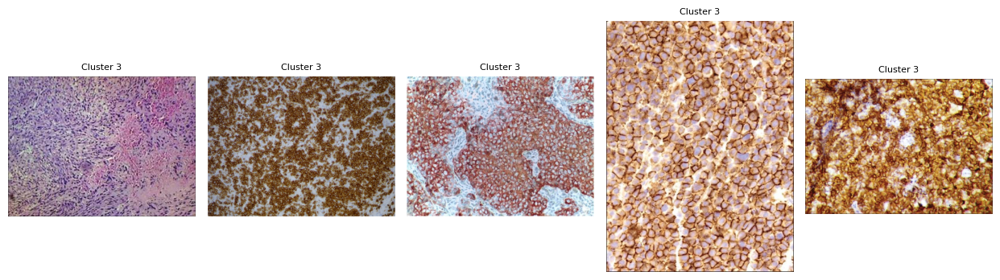

Cluster 4 (Total Images: 355):


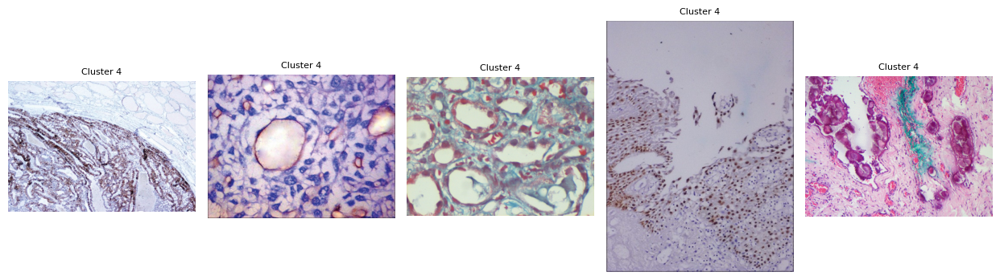

Cluster 5 (Total Images: 296):


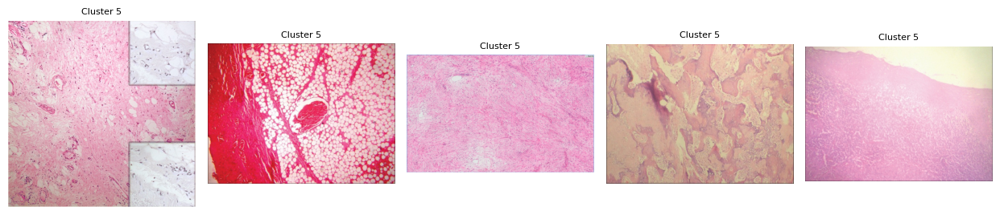

Cluster 6 (Total Images: 266):


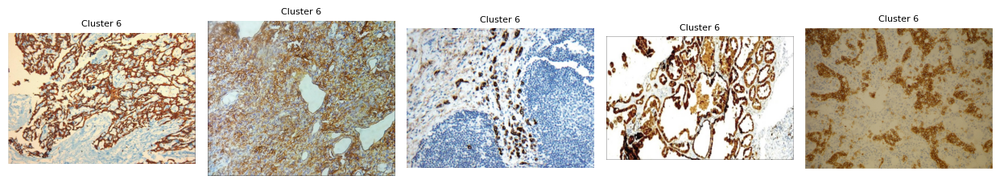

Cluster 7 (Total Images: 331):


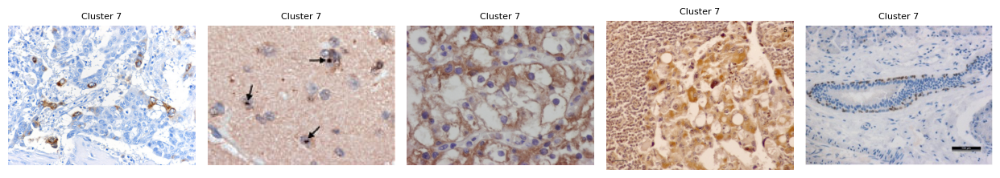

Cluster 8 (Total Images: 395):


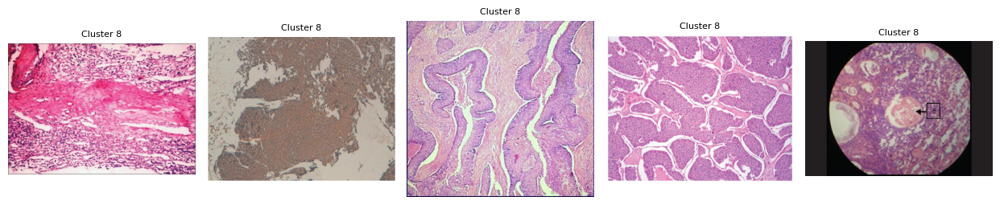

Cluster 9 (Total Images: 330):


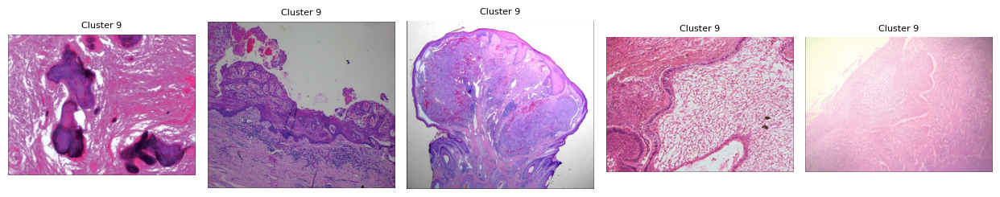

In [10]:
# Number of images to display per cluster
images_per_cluster = 5

for cluster in range(num_clusters):
    cluster_images = df[df['cluster_label'] == cluster]['image_file'].values
    if len(cluster_images) == 0:
        continue  # Skip empty clusters
    sample_images = np.random.choice(cluster_images, size=min(images_per_cluster, len(cluster_images)), replace=False)
    sample_image_paths = [os.path.join(original_images_dir, img_file) for img_file in sample_images]
    print(f"Cluster {cluster} (Total Images: {len(cluster_images)}):")
    display_images(sample_image_paths, titles=[f"Cluster {cluster}"]*len(sample_image_paths))

### **Step 8: Conclusion**

We have successfully:

- Performed image retrieval using FAISS without labels.
- Visualized retrieval results to qualitatively assess similarity.
- Applied K-Means clustering on the embeddings.
- Computed the Silhouette Score to evaluate clustering quality.
- Visualized sample images from each cluster.